# Ilastik-style pixel classification: Feature extraction with filter banks and CNN transfer learning, sparse labeling using brush-strokes/scribbles, classification using random forest

### Basic workflow:
1. Import image stack
2. Select a frame to train the classifier, preview the image
3. Annotate some foreground and background pixels
4. Extract features, train the classifier
5. Preview the segmentation
6. Save classifier or annotate more pixels

#### Features extracted:
- First two layers of VGG16-CNN pretrained on imagenet at different resolutions

#### Github repos that were helpful:
- https://github.com/87surendra/Random-Forest-Image-Classification-using-Python/blob/master/Random-Forest-Image-Classification-using-Python.ipynb
- https://github.com/bnsreenu/python_for_microscopists/blob/master/062-066-ML_06_04_TRAIN_ML_segmentation_All_filters_RForest.py



In [1]:
from semantic_segmentation import interface #runs code on import - may take a while 
import numpy as np
import cv2
from skimage import io
from sklearn.preprocessing import MinMaxScaler 
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
import pickle
from skimage import exposure
#from sklearn.neural_network import MLPClassifier
#from sklearn.ensemble import GradientBoostingClassifier

In [2]:
# import the file the file to train the classifier on
tiff_stack_path = "/scratch/lhinder/agn/stacks_raw/01.tif"
tiff_orig = io.imread(tiff_stack_path)
print("Input image shape: " + str(np.shape(tiff_orig)))

#path and name to save the trained classifier
output_path = "/scratch/lhinder/agn/classifier/" #end with "/"
fname = 'RF_VGGpyr_v0.sav' 

Input image shape: (193, 1024, 1024, 3)


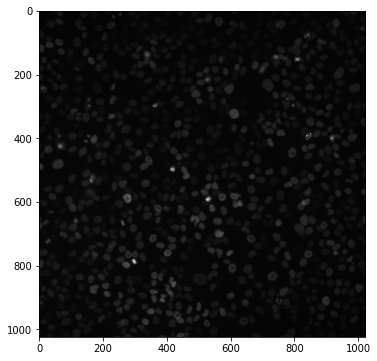

In [3]:
# select and preview the frame to train the classifier on
#recommendation: take middle frame
    
middle_frame = int(np.shape(tiff_orig)[0]/2)
input_image = tiff_orig[middle_frame,:,:,0] #[frame,x,y,channel]
plt.figure(figsize = (6,6))
plt.imshow(input_image, cmap='gray')


## Manual annotation
Annotate some pixels in using a GUI. Key bindings: 
- `left click`: annotate image
- `scroll wheel`: zoom
- `0-9`: set radius of pen
- `m`: change class
- `u`: update classifier training on new annotation
- `q`: quit the window and save the last shown classifier

Check the console to see which class is selected. Any classifier from the `scikit` library can exchange the `RandomForestClassifier` (e.g. `GradientBoostingClassifier`, `MLPClassifier`). You have to click `u` at lest once to return a classifier.

In [4]:
alpha = 0.8 #blending mode for segmentation prediction / nuclear image
clf = RandomForestClassifier(random_state=0)
#clf = GradientBoostingClassifier()
#clf = MLPClassifier()
clf_trained, labels, labels_img, scaled, prediction = interface(input_image, clf, alpha)

(1024, 1024, 192)
Click to label [BACKGROUND]    

In [5]:
pickle.dump(clf_trained, open(output_path+fname, 'wb')) # save the classifier
print("Stored the classifier as "+ output_path+fname)

Stored the classifier as /scratch/lhinder/agn/classifier/RF_VGGpyr_v0.sav


### Check results
The `interface()` function returns:
- `clf_trained`: The trained classifier. This is what gets saved and used in the pipeline
- `labels`: The manual annotation. `NaN`: Not annotated, `0`: class label 0, `1`: class label  1
- `labels_image`: A nice image of the labels overlaid ontop of the nuclear channel
- `scaled`: A intensity-rescaled image of the nuclear channel
- `prediction`: The final prediction on the test frame. Probabiliry from 0-1.

The cell below outputs some of them:

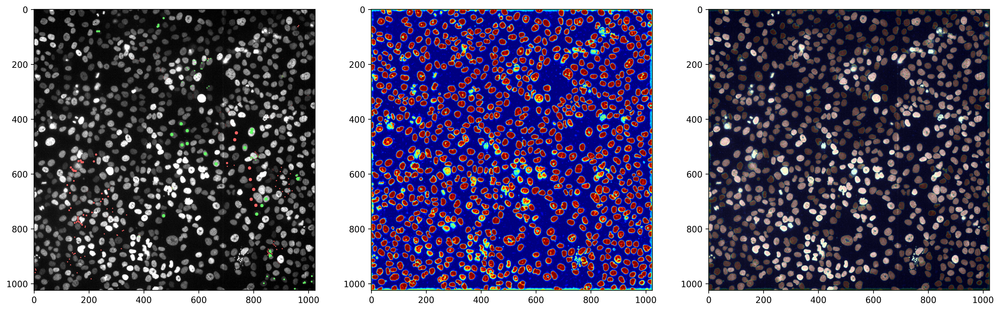

In [6]:
dest = np.empty(np.shape(scaled),np.uint8)
dest = dest.astype('uint8')
cv2.addWeighted(scaled, alpha, prediction, 1 - alpha,0, dest)
fig, (ax1, ax2, ax3) = plt.subplots(figsize=(20, 8), ncols=3, dpi = 300)
ax1.imshow(labels_img)
ax2.imshow(prediction)
ax3.imshow(dest)
plt.show()

## Test segmentation on another frame
Just set `frame_nb` to a random number

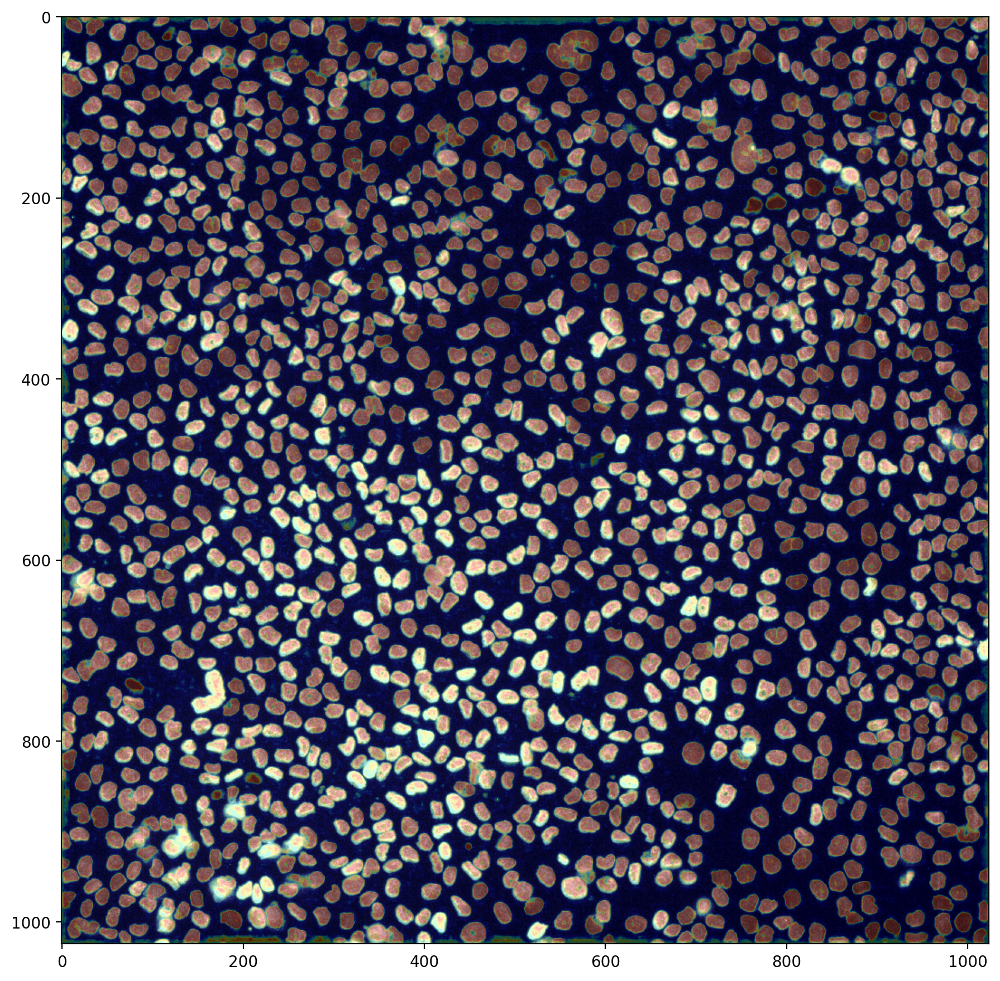

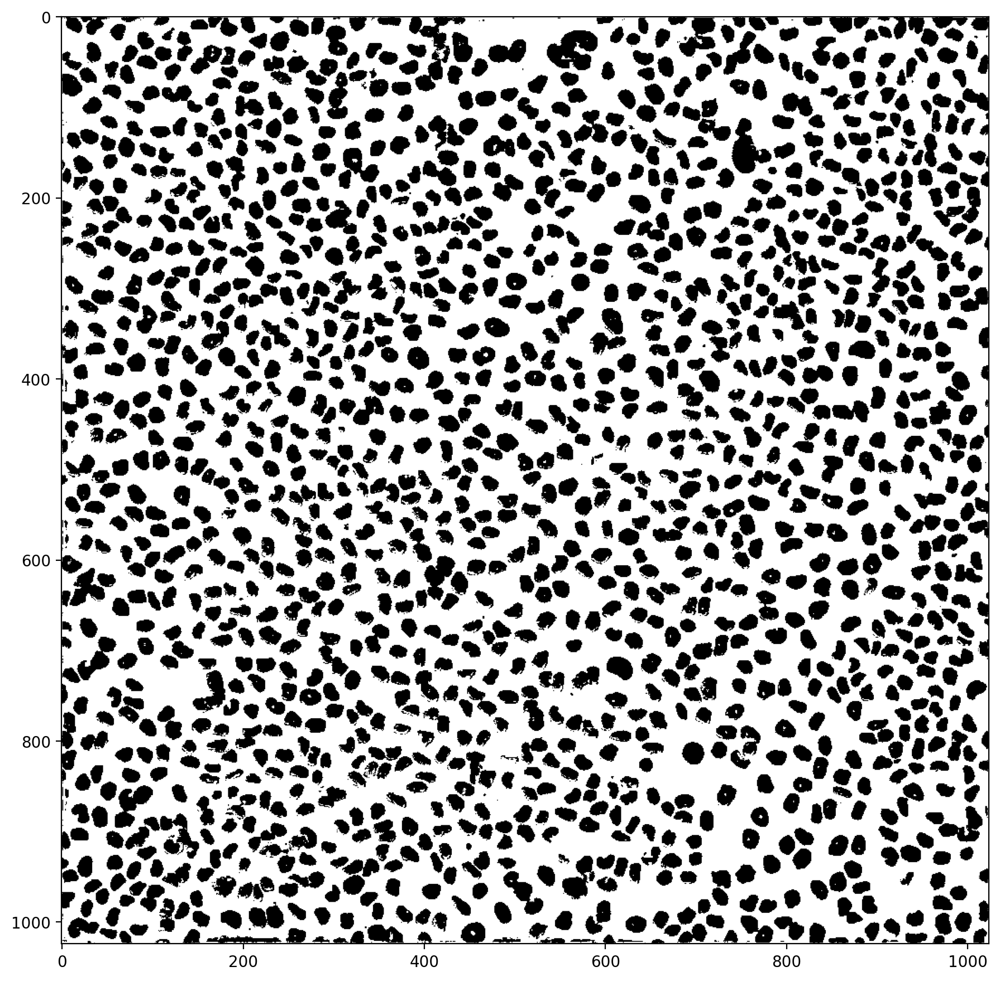

In [8]:
from semantic_segmentation import init_VGG16_pyramid,fd_VGG16_pyramid

frame_nb = 1 # check the classification on another frame of the same FOV
alpha = 0.7 #blending mode for segmentation prediction / nuclear image



clf = pickle.load(open(output_path+fname, 'rb')) # load the classifier



tiff_stack_path = "/scratch/lhinder/agn/stacks_raw/12.tif"
tiff_orig = io.imread(tiff_stack_path)
test_image = tiff_orig[frame_nb,:,:,0]
shapes = [(1024,1024),(512,512),(256,256)]
models = init_VGG16_pyramid(shapes)#display prediction on actual image for all clfs
features = fd_VGG16_pyramid(test_image,models,shapes)


to_predict = features.reshape(np.shape(features)[0]*np.shape(features)[1],np.shape(features)[2])
predicted = clf.predict_proba(to_predict)[:,0] #use [:,0] if displaying probab.    
predicted = np.reshape(predicted, (1024, 1024))
predicted = (predicted*255).astype('uint8')
prediction3 = cv2.applyColorMap(predicted, cv2.COLORMAP_JET)
p2, p98 = np.percentile(test_image, (2, 98))
img8 = exposure.rescale_intensity(test_image, in_range=(p2, p98))
scaler = MinMaxScaler(feature_range=(0, 255))
scaler.fit(img8)
img8 = scaler.transform(img8)
img8 = np.round(img8)
img8 = img8.astype('uint8')
img8 = np.stack((img8,)*3, axis=-1)
background = img8
dest = np.empty(np.shape(background),np.uint8)
dest = dest.astype('uint8')
cv2.addWeighted(background, alpha, prediction3, 1 - alpha,0, dest)

plt.figure(figsize = (11,11),dpi=200)
plt.imshow(dest)
plt.figure(figsize = (11,11),dpi=200)
plt.imshow(predicted>255/2,cmap = "gray")